# Experimental implementation of Gaussian Mixture Models (GMM) in Pytorch

In [1]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np

class GMM(nn.Module):
    def __init__(self, n_components, n_features):
        super(GMM, self).__init__()
        self.n_components = n_components
        self.n_features = n_features

        # Register parameters
        self.means = nn.Parameter(torch.randn(n_components, n_features))
        self.covariances = nn.Parameter(torch.stack([torch.eye(n_features) for _ in range(n_components)]))
        self.weights = nn.Parameter(torch.ones(n_components) / n_components)

    def _e_step(self, X):
        n_samples = X.shape[0]
        probs = torch.zeros((n_samples, self.n_components))
        for k in range(self.n_components):
            diff = X - self.means[k]
            cov_reg = self.covariances[k] + torch.eye(self.n_features) * 1e-6  # Regularization
            inv_cov = torch.inverse(cov_reg)
            quad_form = torch.sum(diff @ inv_cov * diff, dim=1)
            exponent = -0.5 * quad_form
            coeff = 1 / torch.sqrt((2 * torch.pi) ** self.n_features * torch.det(cov_reg))
            probs[:, k] = self.weights[k] * coeff * torch.exp(exponent)
        return probs

    def _m_step(self, X, responsibilities):
        n_samples = X.shape[0]
        Nk = responsibilities.sum(dim=0) + 1e-10
        self.weights.data = Nk / n_samples
        self.means.data = (responsibilities.T @ X) / Nk.unsqueeze(1)

        for k in range(self.n_components):
            diff = X - self.means[k]
            cov = (responsibilities[:, k].unsqueeze(1) * diff).T @ diff / Nk[k]
            self.covariances.data[k] = cov + torch.eye(self.n_features) * 1e-6  # Regularize

    def plot_components(self, X, ax, color='red', alpha=0.8):
        """Plot ellipses for all components."""
        ax.clear()
        ax.scatter(X[:, 0], X[:, 1], alpha=0.6, c='blue', s=10, label="Data")
        for k in range(self.n_components):
            mean = self.means[k].detach().numpy()
            cov = self.covariances[k].detach().numpy()
            eigvals, eigvecs = np.linalg.eigh(cov)
            angle = np.degrees(np.arctan2(eigvecs[1, 0], eigvecs[0, 0]))
            width, height = 2 * np.sqrt(eigvals)
            ellipse = plt.matplotlib.patches.Ellipse(
                mean, width, height, angle=angle,
                edgecolor=color, facecolor='none', linewidth=2, alpha=alpha
            )
            ax.add_patch(ellipse)
        ax.set_xlim(-6, 6)
        ax.set_ylim(-6, 6)
        ax.set_aspect('equal')
        ax.grid(True, alpha=0.3)
        ax.set_title("GMM Fitting (EM Algorithm)")
        ax.legend()

    def fit(self, X, n_iters=100, animate=True):
        fig, ax = plt.subplots(figsize=(8, 6))

        def update(frame):
            # E-step
            with torch.no_grad():
                responsibilities = self._e_step(X)
                responsibilities = responsibilities / (responsibilities.sum(dim=1, keepdim=True) + 1e-10)

            # M-step
            self._m_step(X, responsibilities)

            # Plot current state
            self.plot_components(X, ax, color='red', alpha=0.7)

            # Optional: Print loss every 10 steps
            if frame % 10 == 0:
                total_probs = self._e_step(X).sum(dim=1)
                loss = -torch.sum(torch.log(total_probs + 1e-10))
                print(f"Iter {frame}, Loss: {loss.item():.4f}")

        anim = FuncAnimation(fig, update, frames=n_iters, interval=200, repeat=False)
        plt.tight_layout()
        
        # if animate:
        #     plt.show()
        # else:
        plt.close()

        return anim

In [2]:
from IPython.display import HTML  # For displaying animation in notebook
# Generate synthetic data
torch.manual_seed(42)
X1 = torch.randn(100, 2) + torch.tensor([2.0, 2.0])
X2 = torch.randn(100, 2) + torch.tensor([-2.0, -2.0])
X3 = torch.randn(100, 2) + torch.tensor([5.0, -5.0])
X = torch.cat([X1, X2, X3], dim=0)

# Initialize and fit GMM
gmm = GMM(n_components=3, n_features=2)
anim = gmm.fit(X, n_iters=200, animate=True)

HTML(anim.to_jshtml())

Iter 0, Loss: 1718.2831
Iter 0, Loss: 1295.6843
Iter 10, Loss: 1220.5345
Iter 20, Loss: 1153.5946
Iter 30, Loss: 1153.5946
Iter 40, Loss: 1153.5946
Iter 50, Loss: 1153.5946
Iter 60, Loss: 1153.5946
Iter 70, Loss: 1153.5946
Iter 80, Loss: 1153.5946
Iter 90, Loss: 1153.5946
Iter 100, Loss: 1153.5946
Iter 110, Loss: 1153.5946
Iter 120, Loss: 1153.5946
Iter 130, Loss: 1153.5946
Iter 140, Loss: 1153.5946
Iter 150, Loss: 1153.5946
Iter 160, Loss: 1153.5946
Iter 170, Loss: 1153.5946
Iter 180, Loss: 1153.5946
Iter 190, Loss: 1153.5946


<Figure size 800x800 with 0 Axes>

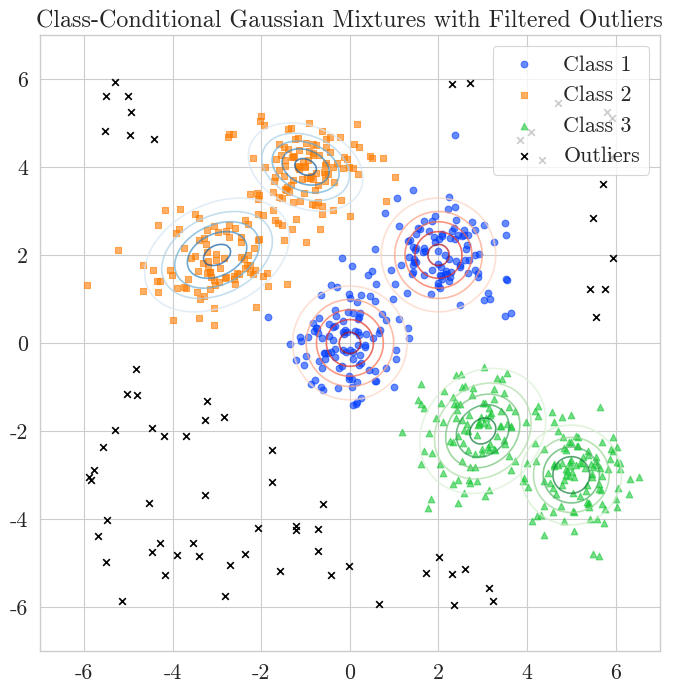

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
import seaborn as sns

# sns.set_theme(style="whitegrid", context="paper", font_scale=1.8)
sns.set_theme(style="whitegrid", context="paper", font_scale=1.8)
sns.set_palette("bright")   # vivid palette instead of pastel
plt.rcParams['font.family'] = ['cmr10']
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.unicode_minus'] = False   # <-- Fix minus sign
# Set random seed for reproducibility
np.random.seed(42)
plt.figure(figsize=(8, 8))

# Define parameters for 3 classes, each is a mixture of 2 Gaussians
class_params = [
    [([0, 0], [[0.5, 0], [0, 0.5]]),
     ([2, 2], [[0.5, 0], [0, 0.5]])],

    [([-3, 2], [[0.8, 0.2], [0.2, 0.5]]),
     ([-1, 4], [[0.5, -0.1], [-0.1, 0.3]])],

    [([3, -2], [[0.6, 0.1], [0.1, 0.6]]),
     ([5, -3], [[0.4, 0], [0, 0.4]])]
]

# Generate samples for each class
n_samples = 200
data_classes = []
for params in class_params:
    samples = []
    for mean, cov in params:
        samples.append(np.random.multivariate_normal(mean, cov, n_samples // 2))
    data_classes.append(np.vstack(samples))

# Generate candidate outliers
candidate_outliers = np.random.uniform(low=-6, high=6, size=(200, 2))

# Keep only outliers that are sufficiently far from all cluster means
min_distance = 3.0  # threshold for "too close"
valid_outliers = []
for outlier in candidate_outliers:
    distances = [np.linalg.norm(outlier - np.array(mean)) for group in class_params for mean, _ in group]
    if np.min(distances) > min_distance:
        valid_outliers.append(outlier)
outliers = np.array(valid_outliers)

# Plot
x, y = np.meshgrid(np.linspace(-7, 7, 200), np.linspace(-7, 7, 200))
pos = np.dstack((x, y))

fig, ax = plt.subplots(figsize=(8, 8))

colors = ['Reds', 'Blues', 'Greens']
markers = ['o', 's', '^']

for class_idx, params in enumerate(class_params):
    # Plot contours for each Gaussian in the mixture
    for mean, cov in params:
        rv = multivariate_normal(mean, cov)
        ax.contour(x, y, rv.pdf(pos), levels=5, cmap=colors[class_idx], alpha=0.7)
    # Scatter data points
    ax.scatter(data_classes[class_idx][:, 0],
               data_classes[class_idx][:, 1],
               label=f'Class {class_idx+1}',
               alpha=0.6,
               marker=markers[class_idx])

# Plot filtered outliers
if len(outliers) > 0:
    ax.scatter(outliers[:, 0], outliers[:, 1], c='black', marker='x', label='Outliers')

ax.set_xlim(-7, 7)
ax.set_ylim(-7, 7)
ax.set_title("Class-Conditional Gaussian Mixtures with Filtered Outliers")
ax.legend()
# plt.show()
plt.savefig("GMM.svg", dpi=300)
